<a href="https://colab.research.google.com/github/SebastianSoto17/Digital-Image-Processing/blob/main/Ejercicios_2_1_S_Soto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

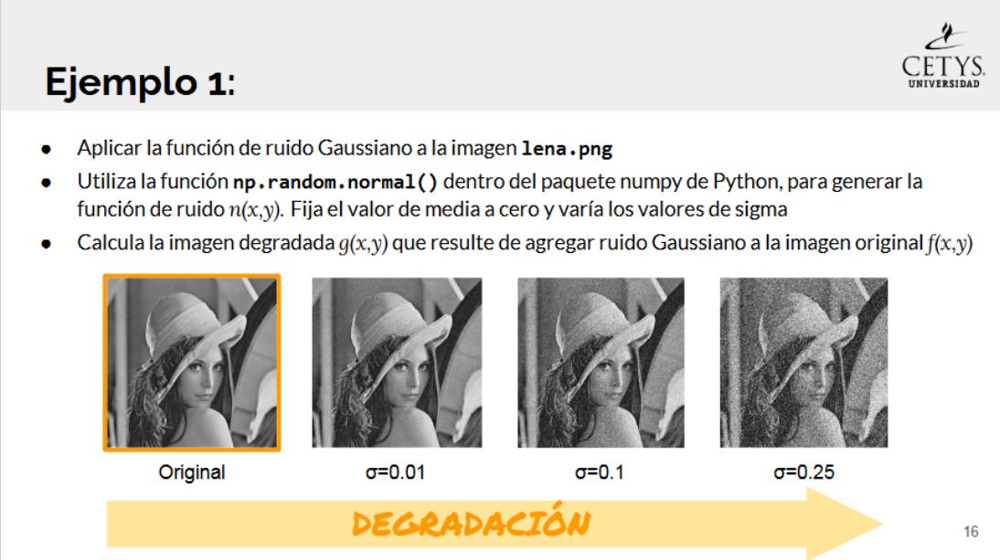

[[  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0 255 ...   0   0   0]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0 255]
 [  0   0   0 ...   0   0   0]]


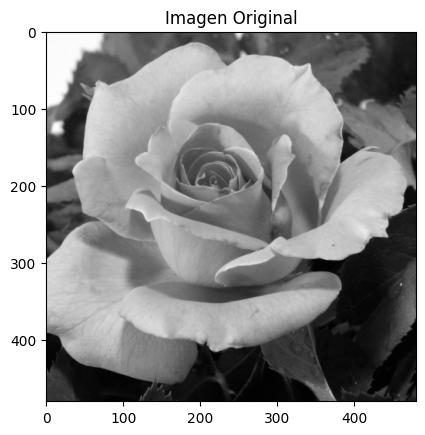

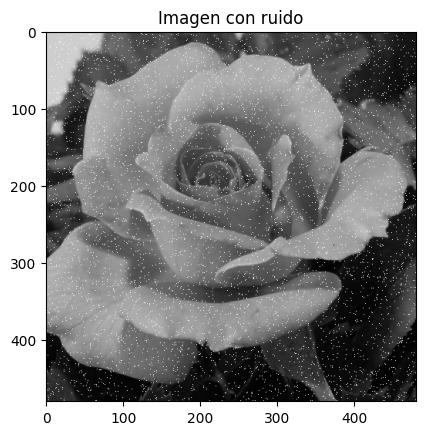

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2 as cv
import cv2
from google.colab.patches import cv2_imshow

img=cv2.imread('rose.png',0)

ruido= np.random.normal(0,0.5,img.shape)
ruido = ruido.astype('uint8')

print(ruido)

suma = cv.add(img,ruido)

plt.imshow(img,cmap='gray'),plt.title('Imagen Original')
plt.axis('off')
plt.show()


plt.imshow(suma,cmap='gray'),plt.title('Imagen con ruido')
plt.axis('off')
plt.show()




[[[255   0   0]
  [  0   0   0]
  [  0 255   1]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [255   0   0]
  [  0   0   0]
  ...
  [  0   0   1]
  [  0   0   0]
  [  0   0 255]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0 255]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   1   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   1]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0 255   0]
  [  0   1   0]
  [  0   0   0]]]


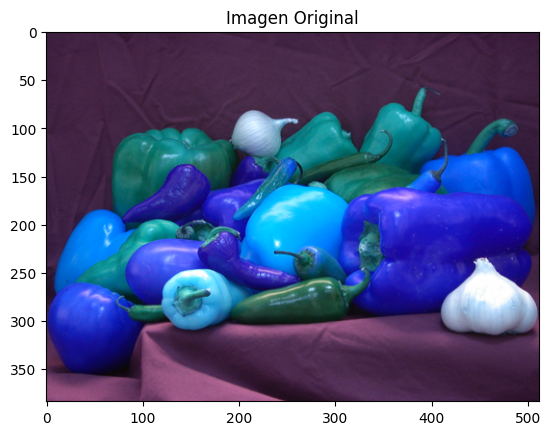

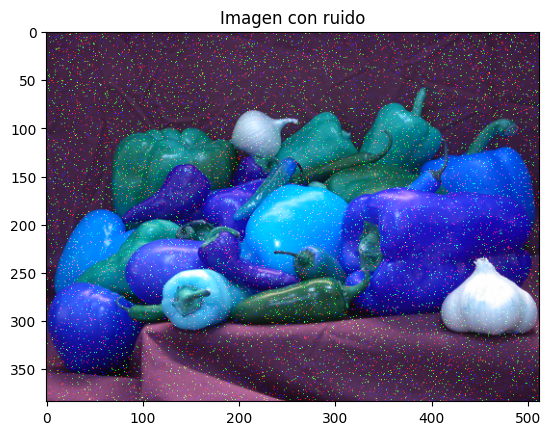

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2 as cv
import cv2
from google.colab.patches import cv2_imshow

img=cv2.imread('peppers.png')

ruido= np.random.normal(0,0.5,img.shape)
ruido = ruido.astype('uint8')

BGR2RGB = cv2.cvtColor(ruido, cv2.COLOR_BGR2RGB)


print(ruido)

suma = cv.add(img,ruido)

plt.imshow(img,cmap='gray'),plt.title('Imagen Original')
plt.show()

plt.imshow(suma,cmap='gray'),plt.title('Imagen con ruido')
plt.show()




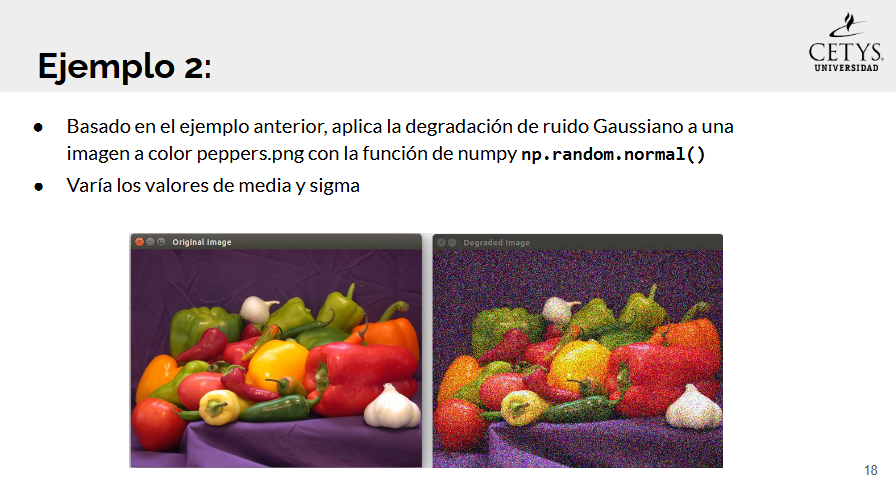

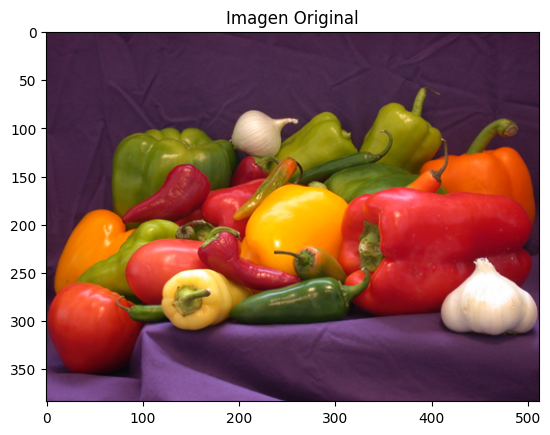

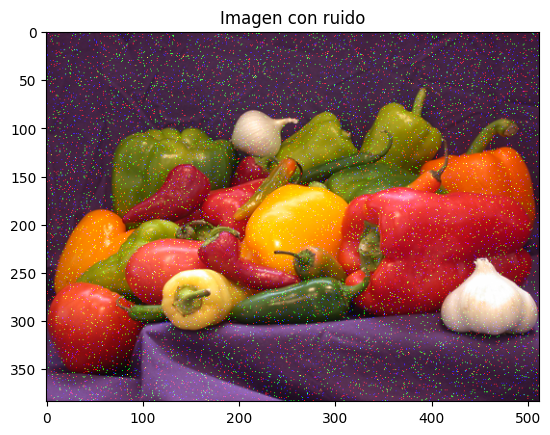

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2 as cv
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('peppers.png')

ruido = np.random.normal(0, 0.5, img.shape).astype('uint8')
suma = cv.add(img, ruido)

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Imagen Original')
plt.axis('off')
plt.show()


plt.imshow(cv2.cvtColor(suma, cv2.COLOR_BGR2RGB)), plt.title('Imagen con ruido')
plt.axis('off')
plt.show()


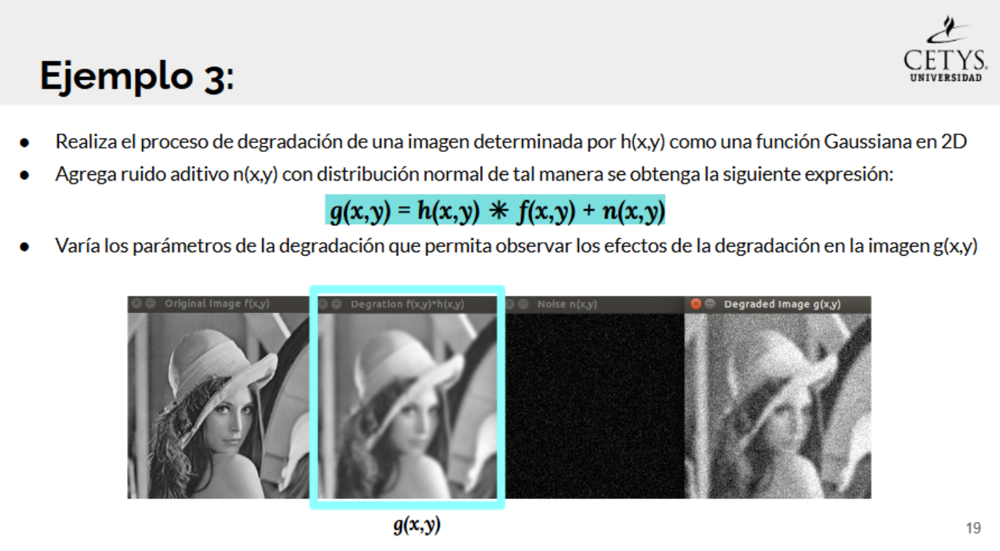

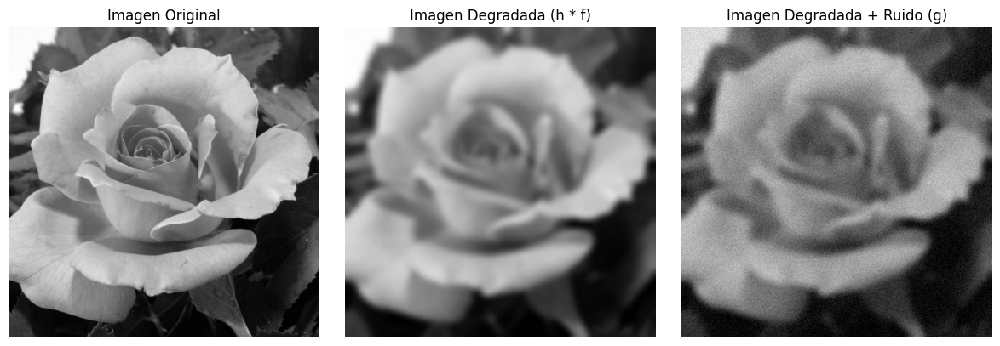

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

img = cv2.imread('rose.png', 0)

kernel_size = 21
sigma_kernel = 5.0

gauss_1d = cv2.getGaussianKernel(ksize=kernel_size, sigma=sigma_kernel)

gauss_2d = gauss_1d @ gauss_1d.T

degraded_float = cv2.filter2D(src=img, ddepth=cv2.CV_32F, kernel=gauss_2d)


sigma_noise = 10.0
noise = np.random.normal(0, sigma_noise, img.shape).astype(np.float32)


noisy_float = degraded_float + noise

noisy_clipped = np.clip(noisy_float, 0, 255).astype(np.uint8)


plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.imshow(img, cmap='gray')
plt.title("Imagen Original")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(degraded_float.astype(np.uint8), cmap='gray')
plt.title("Imagen Degradada (h * f)")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(noisy_clipped, cmap='gray')
plt.title("Imagen Degradada + Ruido (g)")
plt.axis('off')

plt.tight_layout()
plt.show()


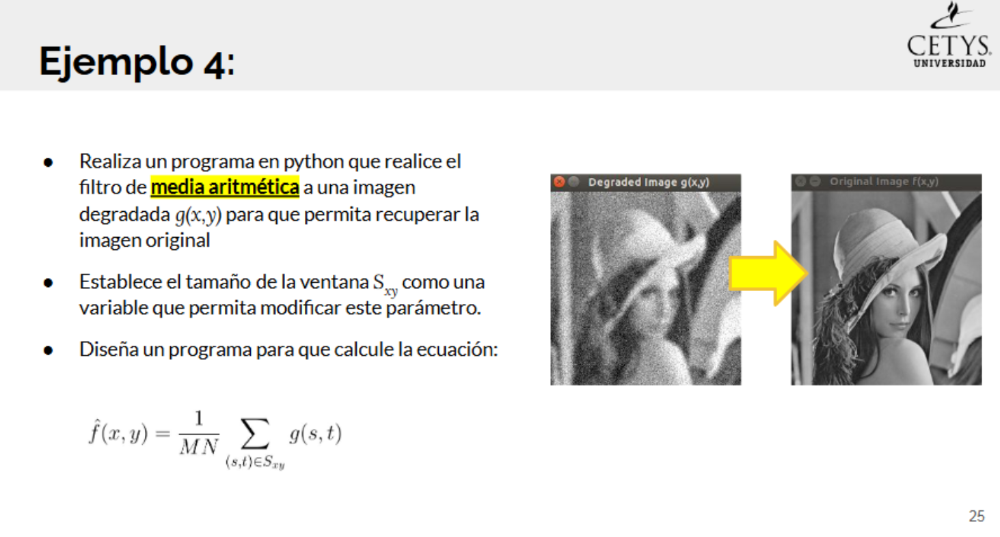

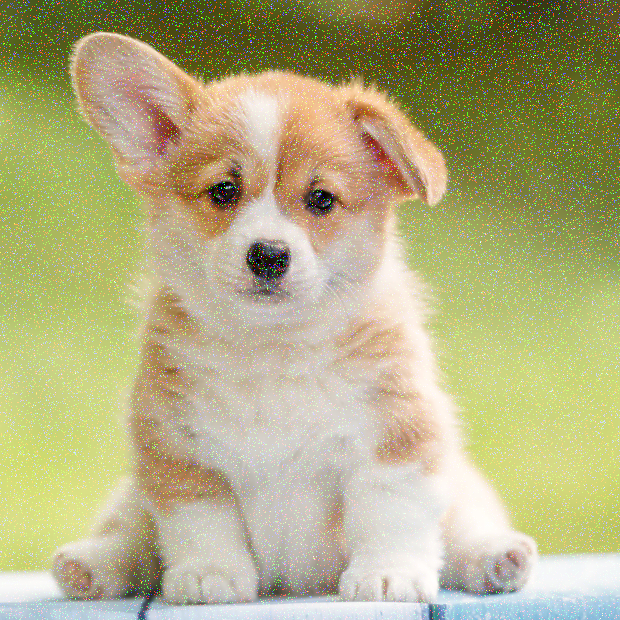

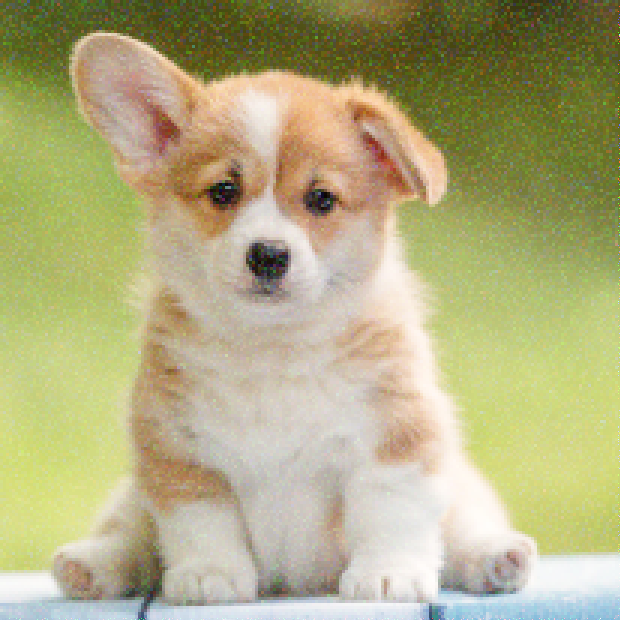

(620, 620, 3)


In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from math import ceil

img = cv2.imread('puppy.png', 1)

N = 3
offset = (N - 1) // 2

gimg2 = np.random.normal(0, 0.6, img.size).reshape(img.shape).astype('uint8')
img = cv2.add(img, gimg2)

cv2_imshow(img)

height = img.shape[0]
width  = img.shape[1]

for k in range(3):
    for j in range(ceil(height / N)):
        cy = offset + j*N
        if cy + offset >= height:
            break
        for i in range(ceil(width / N)):
            cx = offset + i*N
            if cx + offset >= width:
                break

            kernel = img[cy - offset : cy + offset + 1,
                         cx - offset : cx + offset + 1,
                         k]

            mv = np.mean(kernel)

            img[cy - offset : cy + offset + 1,
                cx - offset : cx + offset + 1,
                k] = mv

cv2_imshow(img)
print(img.shape)


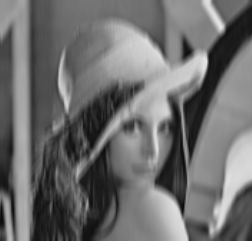

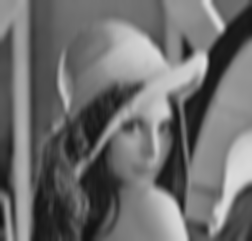

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('mujer.png', 0)

M, N = 5, 5
S_mitad_y, S_mitad_x = M // 2, N // 2

img_filtrada = np.zeros_like(img)

m, n = img.shape

for y in range(m):
    for x in range(n):
        S_xy = img[max(0, y - S_mitad_y) : min(m, y + S_mitad_y + 1),
                   max(0, x - S_mitad_x) : min(n, x + S_mitad_x + 1)]

        sumatoria_S_xy = np.sum(S_xy)

        MN_real = S_xy.size
        img_filtrada[y, x] = sumatoria_S_xy / MN_real

cv2_imshow(img)
cv2_imshow(img_filtrada)


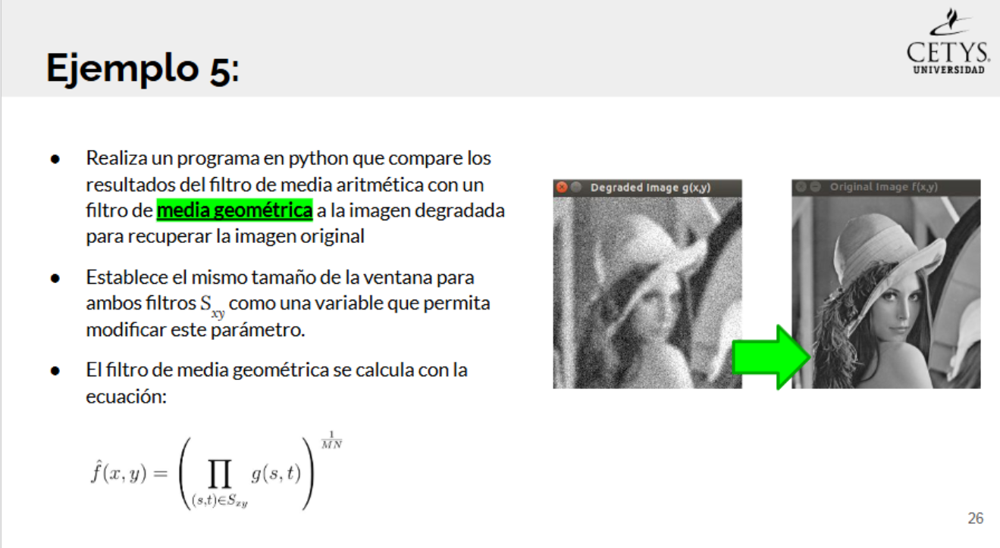

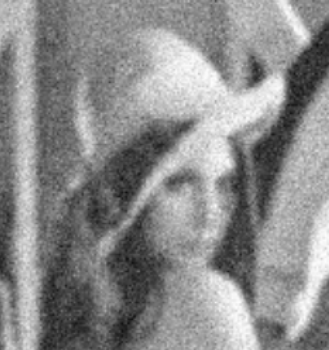

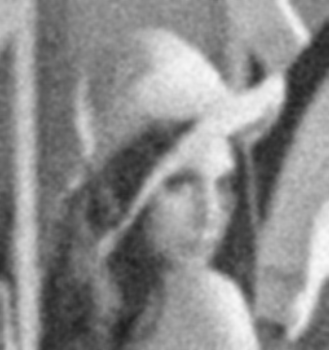

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow


img = cv2.imread('ruido.png', 0)
cv2_imshow(img)

img_mediageo = np.zeros_like(img)
ventana_size = (5,5)
ventana_mitad_y = ventana_size[0] // 2
ventana_mitad_x = ventana_size[1] // 2

m, n = img.shape

for y in range(m):
    for x in range(n):
        vecindad = img[max(0, y-ventana_mitad_y) : min(m, y+ventana_mitad_y+1),
                     max(0, x-ventana_mitad_x) : min(n, x+ventana_mitad_x+1)]

        vecindad = np.where(vecindad == 0, 1e-10, vecindad)
        producto = np.prod(vecindad)
        num_pixeles = vecindad.size
        img_mediageo[y, x] = producto ** (1 / num_pixeles)

cv2_imshow(img_mediageo)



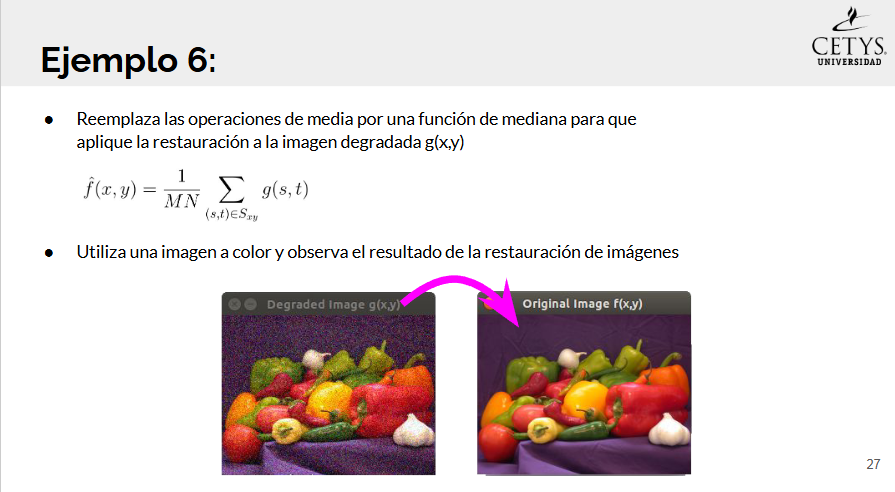

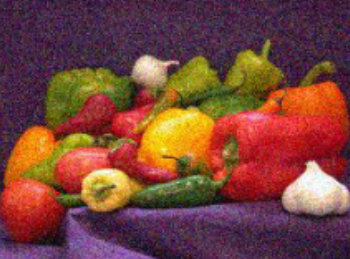

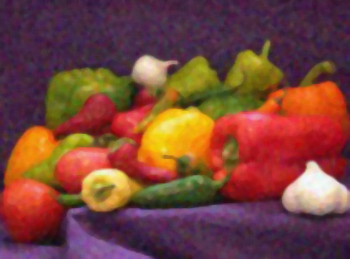

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('peppersruido.png')
cv2_imshow(img)

M, N = 5, 5
S_mitad_y, S_mitad_x = M // 2, N // 2

imagen_rest = np.zeros_like(img)

m, n, canales = img.shape

for c in range(canales):
    for y in range(m):
        for x in range(n):
            S_xy = img[max(0, y - S_mitad_y): min(m, y + S_mitad_y + 1),
                       max(0, x - S_mitad_x): min(n, x + S_mitad_x + 1), c]

            imagen_rest[y, x, c] = np.median(S_xy)

cv2_imshow(imagen_rest)


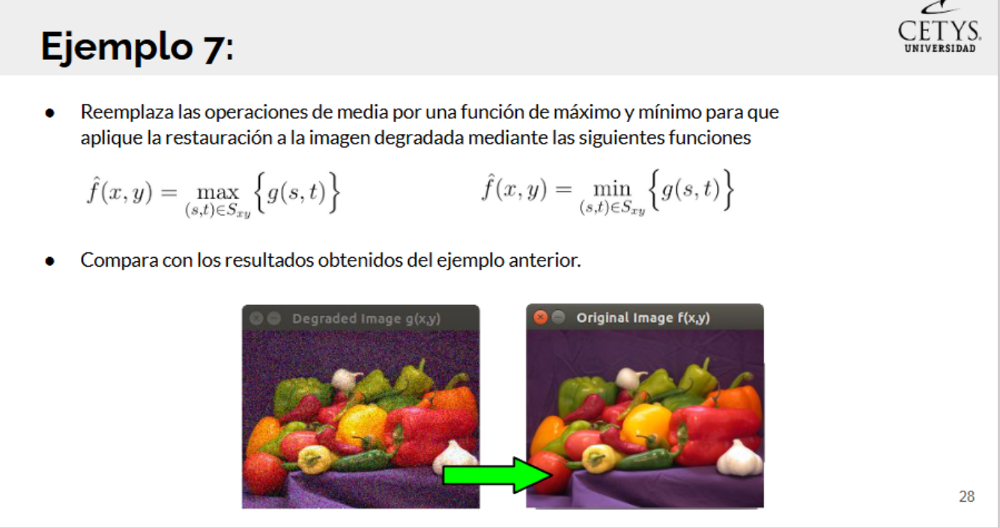

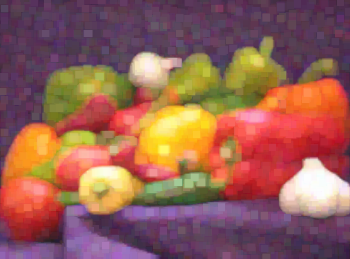

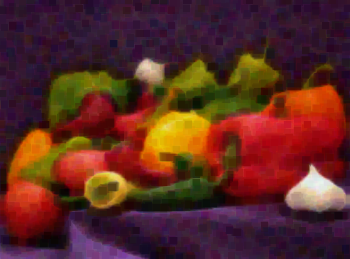

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('peppersruido.png')
M, N = 7, 7
S_mitad_y, S_mitad_x = M // 2, N // 2

img_max = np.zeros_like(img)
img_min = np.zeros_like(img)

m, n, canales = img.shape

for c in range(canales):
    for y in range(m):
        for x in range(n):
            S_xy = img[max(0, y - S_mitad_y): min(m, y + S_mitad_y + 1),
                       max(0, x - S_mitad_x): min(n, x + S_mitad_x + 1), c]

            img_max[y, x, c] = np.max(S_xy)
            img_min[y, x, c] = np.min(S_xy)

cv2_imshow(img_max)
cv2_imshow(img_min)



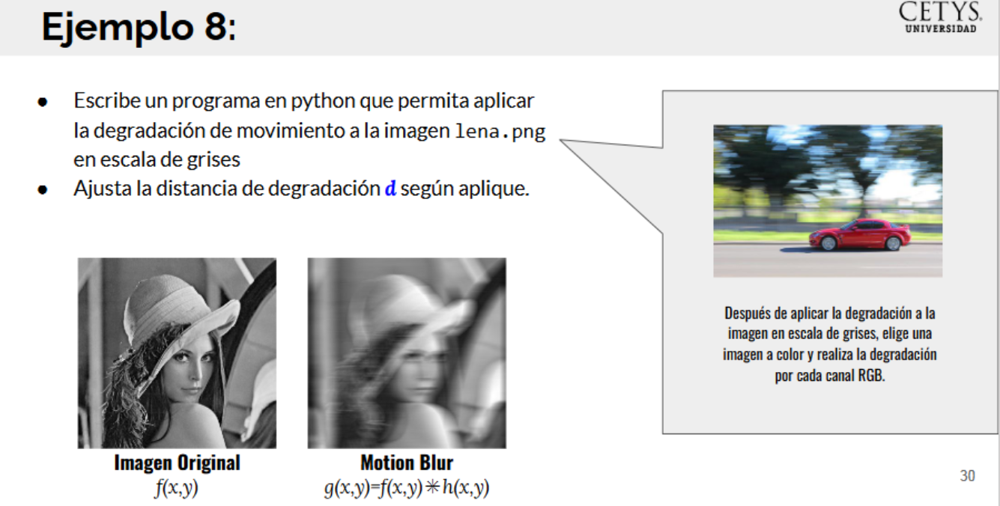

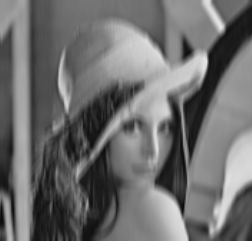

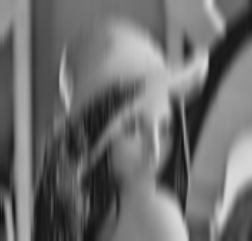

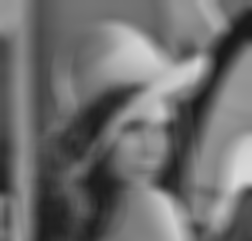

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('mujer.png',0)
kernel_size = 20

kernel_v = np.zeros((kernel_size, kernel_size))
kernel_h = np.copy(kernel_v)

kernel_v[:, int((kernel_size - 1)/2)] = np.ones(kernel_size)
kernel_h[int((kernel_size - 1)/2), :] = np.ones(kernel_size)

kernel_v /= kernel_size
kernel_h /= kernel_size

vertical = cv2.filter2D(img, -1, kernel_v)
horizontal = cv2.filter2D(img, -1, kernel_h)

cv2_imshow(img)
cv2_imshow(vertical)
cv2_imshow(horizontal)


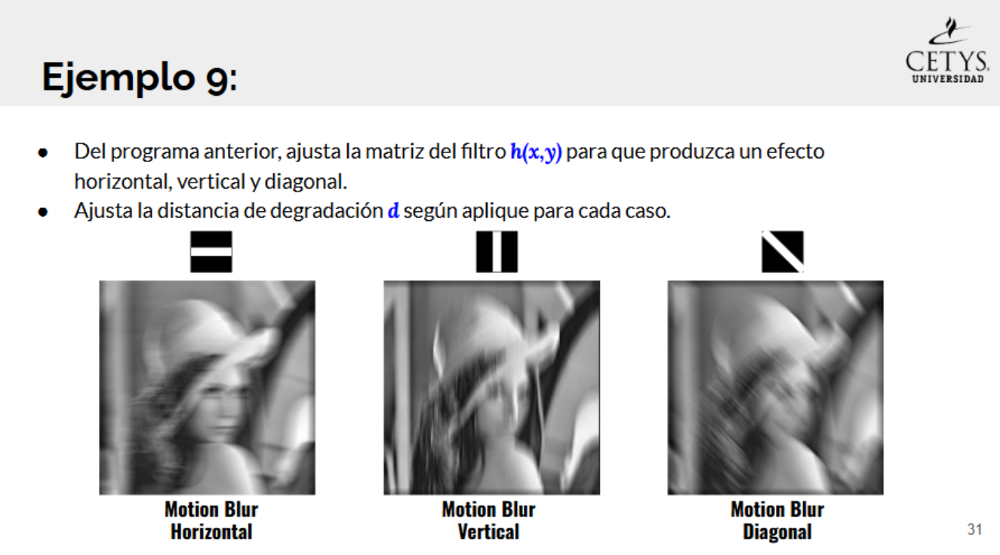

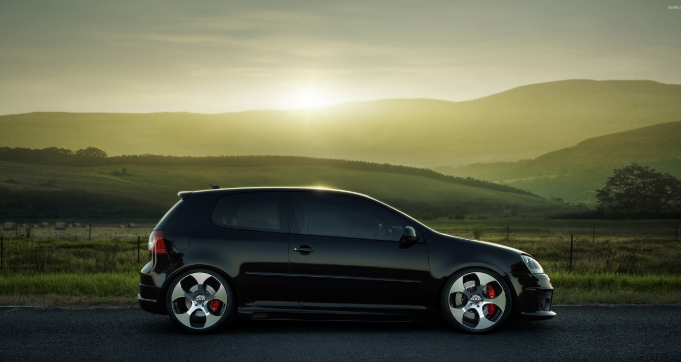

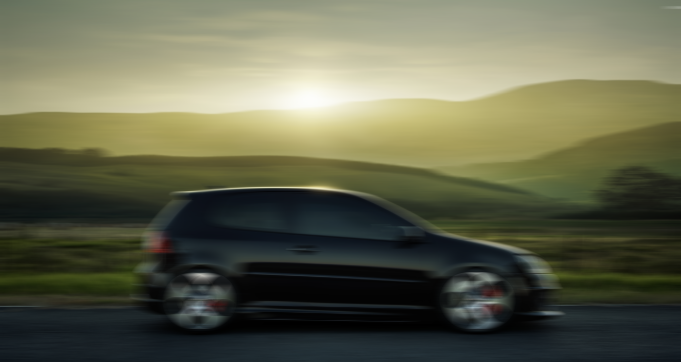

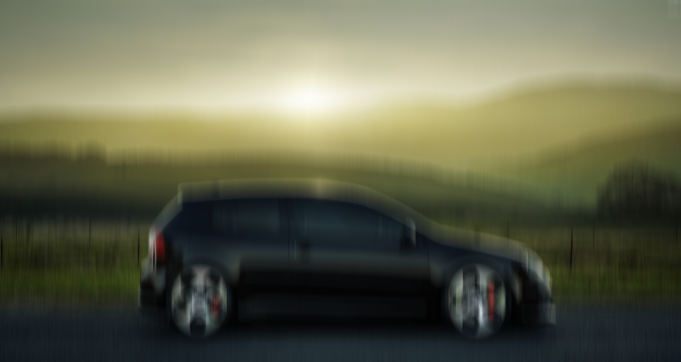

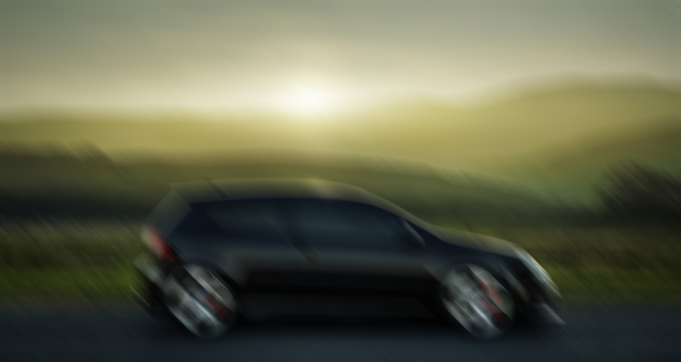

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('carro.png')
cv2_imshow(img)

d = 20

kernel_horizontal = np.ones((1,d),dtype=np.float32)/d
kernel_vertical = np.ones((d,1),dtype=np.float32)/d
kernel_diagonal = np.eye(d)/d

img_horizontal = cv2.filter2D(img, -1, kernel_horizontal)
img_vertical = cv2.filter2D(img, -1, kernel_vertical)
img_diagonal = cv2.filter2D(img, -1, kernel_diagonal)

cv2_imshow(img_horizontal)
cv2_imshow(img_vertical)
cv2_imshow(img_diagonal)